# Объяснимость моделей классического ML

Некоторые алгоритмы машинного обучения обладают свойством объяснимости сами по себе. Объяснить, почему модель выдала то или иное предсказание, возможно непосредственно исходя из понимания принципа работы модели.

Чтобы подчеркнуть, что, в отличие от "черных ящиков", внутреннее устройство таких моделей прозрачно и понятно, их называют "белыми" или "прозрачными" ящиками (glass box).

В частности, к таким алгоритмам относятся **линейные модели** и **модели, основанные на деревьях решений**.

<center><img src="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L14/out/glass_box.png" alt="alttext" width="400"/></center>


# Методы, изучающие отклик модели на изменение входных данных

В этом разделе мы рассмотрим методы, изучающие отклик модели на изменение входных данных. Они также называются **Model-Agnostic Methods** и находятся ближе всего к концепции “черного ящика”. Эти методы изучают связь между входами и выходами модели и пытаются ее объяснить.

<center><img src="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L14/out/black_box_interpretability.png" alt="alttext" width="500"/></center>

## LIME (Local Interpretable Model-agnostic Explanations)

### Принцип работы

Нам бы хотелось оценивать все признаки одновременно для любой модели. Для этого можно попробовать **заменить "черный ящик"** (black-box) **"прозрачным"** (glass-box).

Ключевая идея [LIME](https://arxiv.org/abs/1602.04938) — **локальная аппроксимация сложно-интерпретируемой** (black-box) модели при помощи **легко-интерпретируемой** (glass-box).

Идею **LIME** можно проиллюстрировать следующим образом:

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L14/out/lime_example.png" width="1000"></center>



- Исходная **точка**, для которой требуется интерпретация, выбирается из набора данных.
- Эта точка служит центром локального анализа и основой для генерации новых, возмущенных примеров данных (бутстрап, случайный шум etc).
- Каждый возмущенный пример получает вес, основанный на его близости к исходной точке.
- Используя этот взвешенный набор данных, обучается простая интерпретируемая модель (например, линейная модель). Эта модель стремится приблизить предсказания сложной модели в локальной области, окружающей исходную точку.
- Анализируя, как меняются предсказания в ответ на возмущения, можно получить представление о том, какие факторы влияют на решения модели.


### Как получить набор объектов вблизи искомого?

* В **текстах** можно **удалить слово**.
* Для **изображений** можно **делить картинку на области** (суперпиксели) и поочередно закрашивать их одним и тем же цветом (средним).
* Для **табличных данных**:
 * для **бинарных** переменных в низкоразмерном пространстве достаточно просто менять значение переменной на противоположное (**0 на 1** и **1 на 0**),
 * для **вещественных переменных** были предложены различные варианты. Например, к ним можно прибавлять **Гауссов шум** или **дискретизировать** (например, по квантилям).

### Ограничения

Описанный подход позволяет интерпретировать поведение модели **только в некоторой области** вблизи интересующего нас объекта.

На практике этого может быть достаточно. **Работает быстро**, так как не требует перебора всех комбинаций признаков.

### Пример для изображений (ResNet-18)

#### Идея



На рисунке ниже показан пример того, как LIME работает для классификации изображений.

Представьте, что мы хотим объяснить классификатор, который предсказывает, насколько вероятно, что изображение содержит древесную лягушку.

Мы берем изображение слева и делим его на интерпретируемые компоненты (смежные суперпиксели).

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/lime_interpretable_components.jpg" alt="alttext" width="550"/></center>


Далее мы **отключаем** некоторые из суперпикселей (закрашиваем серым).

Для каждой такой картинки мы получаем вероятность того, что на изображении есть древесная лягушка, и формируем датасет из частично закрашенных картинок и предсказаний.

Затем мы обучаем линейную модель на этом наборе данных. Веса, соответствующие суперпикселю, будут объяснять его вклад в предсказание.

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/lime_explanation_pipeline.jpg" alt="alttext" width="750"/></center>

<center><em>Source: <a href="https://www.oreilly.com/content/introduction-to-local-interpretable-model-agnostic-explanations-lime/">Local Interpretable Model-Agnostic Explanations (LIME): An Introduction</a></em></center>

#### Анализ ResNet-18

Рассмотрим на примере, как работает метод LIME для изображений.

Для начала загрузим и предварительно обработаем изображение. Затем мы будем использовать обученную на ImageNet модель ResNet-18 для классификации этого изображения. После этого мы построим объяснения предсказанных классов с наибольшей вероятностью, используя метод LIME.

In [ ]:
!wget -q "https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/cat_and_dog1.jpg" -O cat_and_dog1.jpg
!wget -q "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/imagenet_class_index.json" -O imagenet_class_index.json

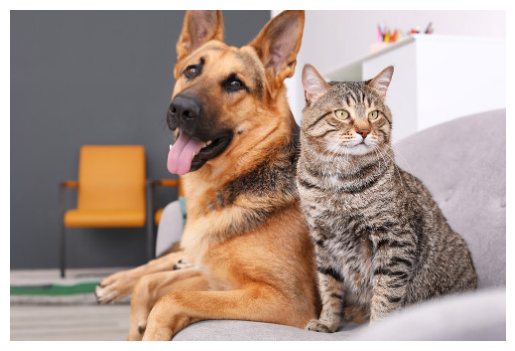

In [ ]:
import os
from PIL import Image
import matplotlib.pyplot as plt


def get_image(path):
    with open(os.path.abspath(path), "rb") as f:
        with Image.open(f) as img:
            return img.convert("RGB")


img = get_image("cat_and_dog1.jpg")
plt.imshow(img)
plt.axis("off")
plt.show()

Теперь нам нужно преобразовать это изображение в тензор PyTorch и нормализовать его для использования в нашей предварительно обученной модели.

In [ ]:
from torchvision.transforms import v2


# Resize & normalize
def get_input_transform():
    transform = v2.Compose(
        [
            v2.Resize(224),
            v2.CenterCrop((224, 224)),
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225],
            ),
        ]
    )
    return transform


# Get cropped image from input tensor
def get_reverse_transform():
    transform = v2.Compose(
        [
            v2.Normalize(mean=(0.0, 0.0, 0.0), std=(1 / 0.229, 1 / 0.224, 1 / 0.225)),
            v2.Normalize(
                mean=(-0.485, -0.456, -0.406),
                std=(1.0, 1.0, 1.0),
            ),
            v2.Lambda(lambda x: torch.permute(x, (0, 2, 3, 1))),
            v2.Lambda(lambda x: x.detach().numpy()),
        ]
    )
    return transform


def get_input_tensors(img):
    transform = get_input_transform()
    # Unsqueeze converts single image to batch of 1
    return transform(img).unsqueeze(0)


def get_crop_img(img_tensor):
    transform = get_reverse_transform()
    return transform(img_tensor)[0]

Загрузим предобученную модель ResNet-18, доступную в PyTorch, и классы изображений из ImageNet.

In [ ]:
import json
import torch
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(weights="ResNet18_Weights.DEFAULT")

idx2label, cls2label, cls2idx = [], {}, {}
with open(os.path.abspath("/content/imagenet_class_index.json"), "r") as read_file:
    class_idx = json.load(read_file)
    idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
    lable2idx = {class_idx[str(k)][1]: k for k in range(len(class_idx))}

Downloading: "https://download.pytorch.org/models/resnet18-f37072fd.pth" to /root/.cache/torch/hub/checkpoints/resnet18-f37072fd.pth
100%|██████████| 44.7M/44.7M [00:00<00:00, 107MB/s]


Получим предсказание. А после этого полученные нами прогнозы (логиты) пропустим через softmax, чтобы получить вероятности и метки классов для 5 лучших прогнозов.

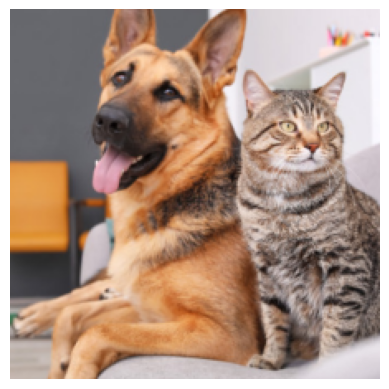

((0.4030763, 235, 'German_shepherd'),
 (0.09531807, 281, 'tabby'),
 (0.06907907, 282, 'tiger_cat'),
 (0.026926253, 285, 'Egyptian_cat'),
 (0.02285188, 811, 'space_heater'))

In [ ]:
import torch.nn.functional as F

img_t = get_input_tensors(img)
model = model.to(device)
model.eval()
logits = model(img_t.to(device))

probs = F.softmax(logits, dim=1)
probs5 = probs.topk(5)
plt.imshow(get_crop_img(img_t))
plt.axis("off")
plt.show()
tuple(
    (p, c, idx2label[c])
    for p, c in zip(
        probs5[0][0].detach().cpu().numpy(), probs5[1][0].detach().cpu().numpy()
    )
)

(tabby — это тоже кошка)

Применим LIME.


In [ ]:
def batch_predict(images):  # images are numpy arrays
    model.eval()
    transform = get_input_transform()
    batch = torch.stack(tuple(transform(Image.fromarray(i)) for i in images), dim=0)

    model.to(device)
    batch = batch.to(device)

    logits = model(batch)
    probs = F.softmax(logits, dim=1)
    return probs.detach().cpu().numpy()

Создадим экзепляр `ImageExplainer` и сгенерируем объект `explanation`. У `LimeImageExplainer` есть особенность: он работает только с `numpy.array` и 3-хканальными изображениями.

In [ ]:
%%capture
!pip install lime

In [ ]:
import lime
from lime import lime_image

import numpy as np

img_t = get_input_tensors(img)

explainer = lime_image.LimeImageExplainer(random_state=42)
explanation = explainer.explain_instance(
    np.array(255 * get_crop_img(img_t)).astype(
        np.uint8
    ),
    batch_predict,  # classification function
    top_labels=5,
    hide_color=0,
    num_samples=1000,  # number of images that will be sent to classification function
    random_seed=42,
)

  0%|          | 0/1000 [00:00<?, ?it/s]

Выведем top-5 предсказаний, сделанных через LIME

In [ ]:
for i, id in enumerate(explanation.top_labels):
    print(i, idx2label[id])

0 German_shepherd
1 tabby
2 tiger_cat
3 Egyptian_cat
4 space_heater


Воспользуемся маской на изображении и посмотрим области, которые дают лучший прогноз.

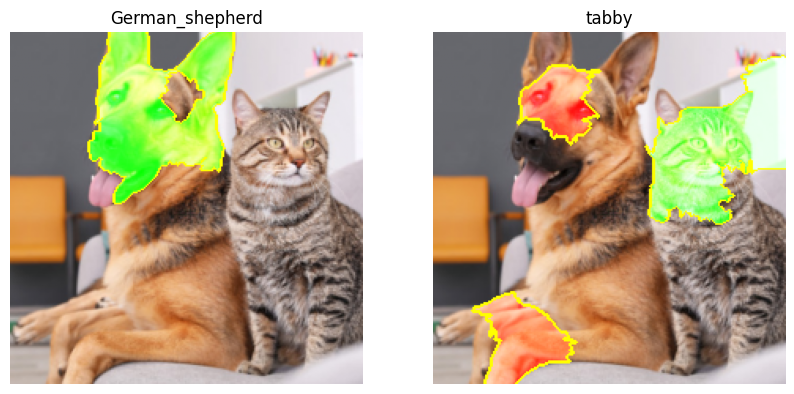

In [ ]:
from skimage.segmentation import mark_boundaries

fig, ax = plt.subplots(nrows=1, ncols=2, figsize=(10, 10))

for i, id in enumerate(explanation.top_labels[:2]):
    temp, mask = explanation.get_image_and_mask(
        id, positive_only=False, num_features=5, hide_rest=False
    )
    img_boundry = mark_boundaries(temp, mask)
    ax[i].imshow(img_boundry)
    ax[i].set_title(idx2label[id])
    ax[i].axis("off")
    # number of clusters to be shown in the image: num_features=5
    # show or not negatively impacting clusters: positive_only=False
    # first 5 may be only positive

Зеленым цветом обозначена область наивысшего прогноза, оранжевым — области, которые меньше всего соответствуют нашему прогнозу. При `positive_only=False` будут показаны только границы.

[Local Interpretable Model-Agnostic Explanations (LIME): An Introduction](https://www.oreilly.com/content/introduction-to-local-interpretable-model-agnostic-explanations-lime/)

[Using Lime with PyTorch (tutorial)](https://github.com/marcotcr/lime/blob/master/doc/notebooks/Tutorial%20-%20images%20-%20Pytorch.ipynb)

## SHAP (SHapley Additive exPlanations)

###Принцип работы

Цель [SHAP](https://christophm.github.io/interpretable-ml-book/shap.html) — объяснить предсказание объекта $x$ путем **вычисления вклада каждого признака** в предсказание. Для этого вычисляются SHAP-значения, основанные на значениях Шепли из теории игр.

SHAP рассматривает объясняемую **модель как игру**, а **признаки** объектов — как **коалицию игроков**. SHAP-значения говорят нам, как справедливо распределить "выигрыш" между игроками — это вклад, который каждый признак вносит в предсказание модели.





### Пример NLP (перевод с английского на русский)

In [ ]:
%%capture
!pip install transformers[sentencepiece] sacremoses

In [ ]:
import torch
import transformers
from transformers import AutoModelForSeq2SeqLM
from IPython.display import clear_output

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

lang = "en"
target_lang = "ru"
model_name = f"Helsinki-NLP/opus-mt-{lang}-{target_lang}"

model = AutoModelForSeq2SeqLM.from_pretrained(model_name)
model.to(device)
clear_output()
print(type(model))

<class 'transformers.models.marian.modeling_marian.MarianMTModel'>


In [ ]:
from transformers import AutoTokenizer

tokenizer = AutoTokenizer.from_pretrained(model_name)

clear_output()

print(type(tokenizer))

input = tokenizer("Hello world!", return_tensors="pt")
print(input)

translated = model.generate(
    **tokenizer("Hello world!", return_tensors="pt").to(device), max_new_tokens=512
)

<class 'transformers.models.marian.tokenization_marian.MarianTokenizer'>
{'input_ids': tensor([[ 160, 5270,  564,   56,    0]]), 'attention_mask': tensor([[1, 1, 1, 1, 1]])}


Теперь переведем целую фразу и проанализируем, как выход модели связан со входом.


In [ ]:
import shap

data = ["SHAP is a method to explain machine learning models predictions."]

explainer = shap.Explainer(model, tokenizer, max_new_tokens=512)

explanation = explainer(data)
clear_output()

На выходе получаем объект класса `shap.Explanation` [🛠️[doc]](https://shap.readthedocs.io/en/latest/generated/shap.Explanation.html#shap-explanation), который содержит значения Шепли для каждого токена.

In [ ]:
print("Data", explanation.data)
print("SHAP values shape", explanation.shape)  # 1, in, out

Data (array(['▁S', 'H', 'AP', '▁is', '▁a', '▁method', '▁to', '▁explain',
       '▁machine', '▁learning', '▁models', '▁predictions', '.', ''],
      dtype=object),)
SHAP values shape (1, 14, 13)


Теперь, используя интерактивную визуализацию `shap.plots.text` [🛠️[doc]](https://shap.readthedocs.io/en/latest/example_notebooks/api_examples/plots/text.html), можно отобразить результат объяснения.

In [ ]:
shap.initjs()
shap.plots.text(explanation)

Анализ важностей через SHAP в данном примере похож на анализ карт внимания в трансформерах: можно проследить, какие входные токены наиболее важны для конкретного выходного токена. При этом SHAP дает более наглядную визуализацию, напрямую связывая выход и вход модели. Анализ карт внимания затруднителен в больших моделях, состоящих из многих слоев: сложно проследить полный путь трансформации входных токенов в выходные, так как важности "размываются".

# Градиентные методы

## Vanilla Gradient

### Идея метода

Имея информацию о структуре модели, можно использовать градиент, чтобы понять, как входы связаны с выходом.

Градиент указывает направление возрастания функции. Если мы выберем  **logit, соответствующий метке наиболее вероятного класса**, и посчитаем для него **градиент по исходному изображению**, мы можем узнать, какие пиксели нужно “усилить”, чтобы модель была более уверена в ответе.

<center><img src ="https://edunet.kea.su/repo/EduNet-content/dev-2.3/L14/out/vanilla_gradient_idea.png" width="800"></center>

<center><em>Source: <a href="https://cs231n.stanford.edu/slides/2017/cs231n_2017_lecture12.pdf">CS231: Visualizing and Understanding</a></em></center>

### Пример изображения (ResNet-18)

Загрузим изображение

In [ ]:
!wget -q "https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/cat_and_dog1.jpg" -O cat_and_dog1.jpg
!wget -q "https://edunet.kea.su/repo/EduNet-web_dependencies/datasets/imagenet_class_index.json" -O imagenet_class_index.json

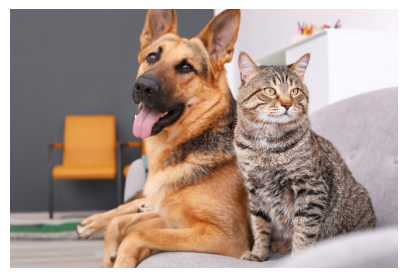

In [ ]:
import os
import matplotlib.pyplot as plt
from PIL import Image


def get_image(path):
    with open(os.path.abspath(path), "rb") as f:
        with Image.open(f) as img:
            return img.convert("RGB")


img = get_image("cat_and_dog1.jpg")
plt.rcParams["figure.figsize"] = (5, 5)
plt.imshow(img)
plt.axis("off")
plt.show()

In [ ]:
from torchvision.transforms import v2

# Resize & normalize


def get_input_transform():
    transform = v2.Compose(
        [
            v2.Resize(224),
            v2.CenterCrop((224, 224)),
            v2.ToImage(),
            v2.ToDtype(torch.float32, scale=True),
            v2.Normalize(
                mean=[0.485, 0.456, 0.406],
                std=[0.229, 0.224, 0.225],
            ),
        ]
    )
    return transform


# Get cropped image from input tensor
def get_reverse_transform():
    transform = v2.Compose(
        [
            v2.Normalize(mean=[0.0, 0.0, 0.0], std=[1 / 0.229, 1 / 0.224, 1 / 0.225]),
            v2.Normalize(
                mean=[-0.485, -0.456, -0.406],
                std=[1.0, 1.0, 1.0],
            ),
            v2.Lambda(lambda x: torch.permute(x, (0, 2, 3, 1))),
            v2.Lambda(lambda x: x.detach().numpy()),
        ]
    )
    return transform


def get_input_tensors(img):
    transform = get_input_transform()
    # Unsqueeze converts single image to batch of 1
    return transform(img).unsqueeze(0)


def get_crop_img(img_tensor):
    transform = get_reverse_transform()
    return transform(img_tensor)[0]

Загрузим предобученную модель ResNet-18, доступную в PyTorch, и классы изображений из ImageNet.

In [ ]:
import json
import torch
from torchvision import models

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

model = models.resnet18(weights="ResNet18_Weights.DEFAULT")

idx2label, cls2label, cls2idx = [], {}, {}
with open(os.path.abspath("/content/imagenet_class_index.json"), "r") as read_file:
    class_idx = json.load(read_file)
    idx2label = [class_idx[str(k)][1] for k in range(len(class_idx))]
    lable2idx = {class_idx[str(k)][1]: k for k in range(len(class_idx))}

Получим предсказание. А после этого полученные нами прогнозы (logits) пропустим через softmax, чтобы получить вероятности и метки классов для 6 лучших прогнозов.

In [ ]:
print(type(img))
img_t = get_input_tensors(img)

model.to(device)
model.eval()
logits = model(img_t.to(device))

<class 'PIL.Image.Image'>


In [ ]:
import torch.nn.functional as F


def top_k_class(logits, k=6):
    prediction = F.softmax(logits, dim=1)
    top_props, top_inds = prediction.topk(k)

    for i in range(k):
        category_name = idx2label[top_inds[0][i].item()]
        score = top_props[0][i].item()
        print(f"{category_name} {top_inds[0][i].item()}: {100 * score:.1f}%")


top_k_class(logits)

German_shepherd 235: 40.3%
tabby 281: 9.5%
tiger_cat 282: 6.9%
Egyptian_cat 285: 2.7%
space_heater 811: 2.3%
malinois 225: 1.2%


Включаем расчет градиента для изображения. Делаем предсказание. Выбираем наиболее вероятный logit.

In [ ]:
img_t.requires_grad = True  # Tell pytorch to compute grads w.r.t. inputs too

logits = model(img_t.to(device))  # [1,1000] batch of one element, 1000 class scores
top_score, top_idx = logits[0].topk(1)  # Get id of class with best score
id = top_idx[0].item()

print(id, idx2label[id])  # Print the label this class

score = logits[:, id]  # Model output for particular class

235 German_shepherd


Для выхода модели, соответствующего нашему классу, рассчитываем градиент.

In [ ]:
# Compute gradients
score.backward(retain_graph=True)

# retain_grad = True is not nessesary
# But if we run this code second time, we got a torch error without it
# because pytorch want to accumulate gradients explicitly

print(img_t.grad.shape)

torch.Size([1, 3, 224, 224])


У входного тензора (изображения) появился градиент, который указывает на то, как каждый элемент повлиял на выход модели. Отобразим этот градиент.

In [ ]:
import numpy as np
from matplotlib import pylab as P


# Helper method to display grad
def grad_to_image(raw_grads, percentile=99):
    gradients = raw_grads.detach().cpu().numpy()
    gradients = np.transpose(gradients, (0, 2, 3, 1))[0]

    image_2d = np.sum(np.abs(gradients), axis=2)

    vmax = np.percentile(image_2d, percentile)
    vmin = np.min(image_2d)

    return np.clip((image_2d - vmin) / (vmax - vmin), 0, 1)


def plot_saliency_map(img_tensor, saliency_map):
    plt.rcParams["figure.figsize"] = (10, 5)
    plt.subplot(1, 2, 1)
    img = get_crop_img(img_t)
    plt.imshow(img)
    plt.axis("off")
    plt.subplot(1, 2, 2)
    plt.imshow(saliency_map, cmap=P.cm.gray, vmin=0, vmax=1)
    plt.axis("off")
    plt.show()

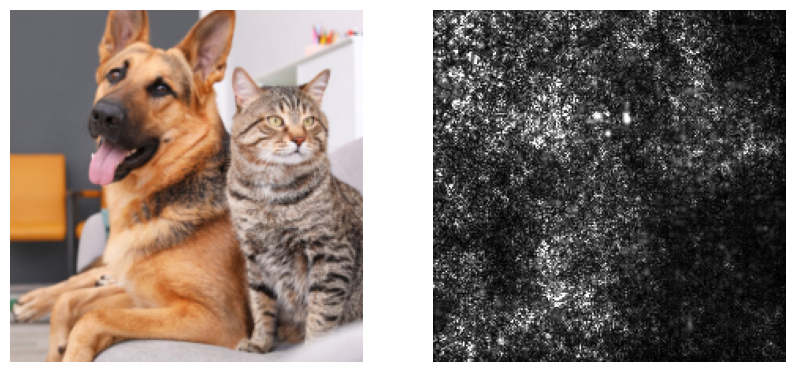

In [ ]:
saliency_map = grad_to_image(img_t.grad)
plot_saliency_map(img_t, saliency_map)

**Карта важности (saliency map)**, полученная таким образом, получается очень зашумленной.

### Проблема насыщения (saturation)

Одним из недостатков карты важности (saliency map), полученной методом Vanilla Gradient, является проблема насыщения (saturation). Простыми словами эту проблему можно сформулировать так: если какой-то признак “идеально” характеризует принадлежность объекта к определенному классу, то градиент по этому признаку будет нулевым. То есть **Vanilla Gradient** будет занижать важность очень хороших признаков.

### Adversarial attacks

Принцип взятия градиента по входу используется при **состязательных атаках (adversarial attacks)**.

Если не просто визуализировать градиент, а с его помощью менять изображение, усиливая определенную метку класса, то можно обмануть сеть и заставить ее неверно классифицировать картинку, незначительно поменяв ее.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/adversarial_attack.jpg" width="700"></center>

<center><em>Source: <a href="https://arxiv.org/pdf/1412.6572.pdf">Explaining and Harnessing Adversarial Examples</a></em></center>

## SmoothGrad


### Идея метода

Проблемой Vanilla Gradient Ascent является большая зашумленность карты важности. Было придумано несколько способов борьбы с этим, один из них был предложен в статье [SmoothGrad: removing noise by adding noise](https://arxiv.org/pdf/1706.03825.pdf).

Как вы можете догадаться из названия статьи, идея SmoothGrad заключается в добавлении к исходному изображению $x$ гауссовского шума:

$$\large x+\mathcal{N}(0, \sigma^2)$$

Для набора зашумленных изображений с помощью **Vanilla Gradient** рассчитываются **карты важности (saliency map)**:

$$\large M_c(x+\mathcal{N}(0, \sigma^2))$$

Карты важности, полученные от зашумленных изображений, усредняются:

$$\large \text{SmoothGrad} = \frac{1}{n}\sum_{1}^{n}M_c(x+\mathcal{N}(0, \sigma^2))$$






<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/smoth_grad.png" width="800">

<em>Source: <a href="https://arxiv.org/pdf/1706.03825.pdf">SmoothGrad: removing noise by adding noise
</a></em></center>


### Пример изображения (ResNet-18)

In [ ]:
%%capture
!pip install -q saliency

У кода есть особенность: нужно написать функцию `call_model_function`, вызывающую модель.

При этом любое изображение, поданное в метод `GetMask` класса `GradientSaliency`, будет преобразовано в `np.array`. К тому же, размеры входного изображения и карты важности на выходе должны совпадать, что осложняет использование `torchvision.transforms.v2`.

In [ ]:
import numpy as np
import saliency.core as saliency


model = models.resnet18(weights="ResNet18_Weights.DEFAULT")


def call_model_function(img, call_model_args=None, expected_keys=None):
    img_t = torch.tensor(np.transpose(img, (0, 3, 1, 2)))
    transform = v2.Normalize(
        mean=[0.485, 0.456, 0.406],
        std=[0.229, 0.224, 0.225],
    )
    img_t = transform(img_t)
    img_t.requires_grad_(True)

    model.to(device)
    model.eval()
    logits = model(img_t.float().to(device))

    top_score, top_idx = logits[0].topk(1)  # Get id of class with best score
    target_class_idx = top_idx[0].item()

    output = logits[:, target_class_idx]
    grads = torch.autograd.grad(
        output, img_t, grad_outputs=torch.ones_like(output)
    )  # output[:, target_class_idx]
    grads = torch.movedim(grads[0], 1, 3)
    gradients = grads.detach().numpy()
    return {saliency.base.INPUT_OUTPUT_GRADIENTS: gradients}

Получаем Vanilla Gradient, рассчитанный для исходного изображения с помощью установленной библиотеки, и результат  SmoothGrad.

In [ ]:
img = get_image("cat_and_dog1.jpg")
img_t = get_input_tensors(img)
img_arr = get_crop_img(img_t)

gradient_saliency = saliency.GradientSaliency()

vanilla_mask_3d = gradient_saliency.GetMask(img_arr, call_model_function)
smoothgrad_mask_3d = gradient_saliency.GetSmoothedMask(img_arr, call_model_function)

# Call the visualization methods to convert the 3D tensors to 2D grayscale.
vanilla_mask_grayscale = saliency.VisualizeImageGrayscale(vanilla_mask_3d)
smoothgrad_mask_grayscale = saliency.VisualizeImageGrayscale(smoothgrad_mask_3d)

Визуализируем результат:

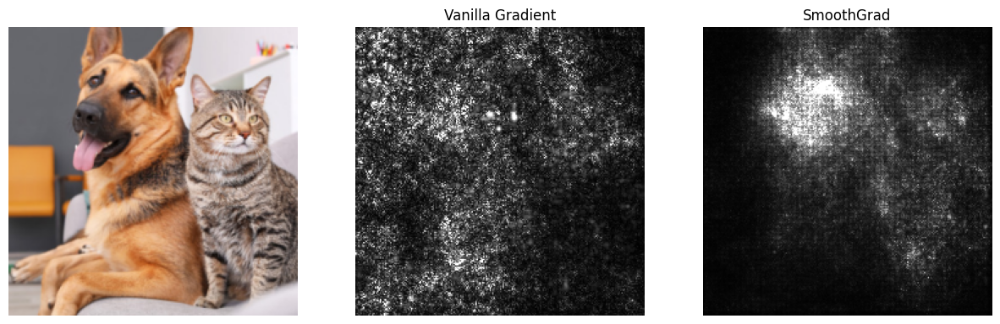

In [ ]:
from matplotlib import pylab as P


def ShowGrayscaleImage(im, title="", ax=None):
    if ax is None:
        P.figure()
    P.axis("off")
    P.imshow(im, cmap=P.cm.gray, vmin=0, vmax=1)
    P.title(title)


# Set up matplot lib figures.
plt.rcParams["figure.figsize"] = (15, 5)

plt.subplot(1, 3, 1)
plt.imshow(img_arr)
plt.axis("off")

ShowGrayscaleImage(
    vanilla_mask_grayscale, title="Vanilla Gradient", ax=P.subplot(1, 3, 2)
)
ShowGrayscaleImage(smoothgrad_mask_grayscale, title="SmoothGrad", ax=P.subplot(1, 3, 3))

##Integrated Gradients

### Идея метода

Следующий метод, который мы посмотрим, называется **Integrated Gradients**. Он напоминает **SmoothGrad** тем, что мы намеренно "портим" изображения. Давайте разберемся, как он работает.

В методе **Integrated Gradients** мы выбираем **опорное изображение** $x'$. В качестве опорного изображения используется черный фон (все нули по RGB-каналам). Оцениваемое изображение $x$ примешивают к опорному изображению $x’$ с пропорцией $\alpha$:

$$\large x'+\alpha(x-x')$$

Таким образом мы портим изображение и постепенно его восстанавливаем.

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/IG_fireboat_1.png" width="900">

<em>Source: <a href="https://www.tensorflow.org/tutorials/interpretability/integrated_gradients">Tensorflow tutorials: Integrated gradients
</a></em></center>

Для смеси изображений считается **Vanilla Gradient**:

$$\large M_c(x'+\alpha(x-x'))$$

Формула, лежащая в основе **Integrated Gradients**, была предложена в [статье](https://arxiv.org/pdf/1703.01365.pdf). Это интегральное значение градиента при восстановлении изображения.

В расчетах IntegratedGrads считается как сумма:

$$\large \text{IntegratedGrads}(x) \approx (x-x')\cdot\sum_{k=1}^m M_c(x'+\frac{k}{m}(x-x'))\cdot\frac{1}{m}$$

Значение $m$ выбирают в диапазоне от $20$ до $300$.

Пример результата:

<center><img src ="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/IG_fireboat.png" width="500">

<em>Source: <a href="https://www.tensorflow.org/tutorials/interpretability/integrated_gradients">Tensorflow tutorials: Integrated gradients
</a></em></center>

Integrated Gradients частично решает проблему насыщения за счет изменения изображения.

### Пример изображения (ResNet-18)

In [ ]:
%%capture
!pip install captum

In [ ]:
output = model(img_t.to(device))
output = F.softmax(output, dim=1)
prediction_score, pred_label_idx = torch.topk(output, 1)

pred_label_idx.squeeze_()
predicted_label = idx2label[pred_label_idx.item()]
print("Predicted:", predicted_label, "(", prediction_score.squeeze().item(), ")")

Predicted: German_shepherd ( 0.40307629108428955 )


In [ ]:
from captum.attr import IntegratedGradients

integrated_gradients = IntegratedGradients(model)
attributions_ig = integrated_gradients.attribute(
    img_t.to(device), target=pred_label_idx, n_steps=200
)

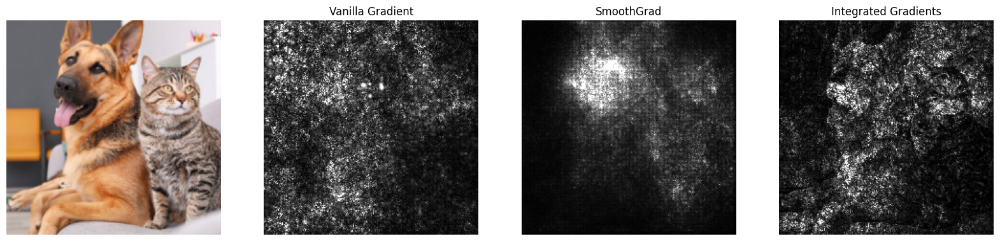

In [ ]:
saliency_map = grad_to_image(attributions_ig)

# Set up matplotlib figures
plt.rcParams["figure.figsize"] = (20, 5)

plt.subplot(1, 4, 1)
plt.imshow(img_arr)
plt.axis("off")

ShowGrayscaleImage(
    vanilla_mask_grayscale, title="Vanilla Gradient", ax=P.subplot(1, 4, 2)
)
ShowGrayscaleImage(smoothgrad_mask_grayscale, title="SmoothGrad", ax=P.subplot(1, 4, 3))
ShowGrayscaleImage(saliency_map, title="Integrated Gradients", ax=P.subplot(1, 4, 4))

## Grad-CAM

Развитием **Gradient Ascent** для сверточных нейронных сетей **CNN** является метод **Grad-CAM** (Gradient-weighted Class Activation Mapping).

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/gradcam-architecture.png" alt="alttext" width="800"/></center>

<center><em>Source: <a href="https://learnopencv.com/intro-to-gradcam">GradCAM – Enhancing Neural Network Interpretability in the Realm of Explainable AI</a></em></center>

### Идея метода

После каждого **сверточного слоя** нейронной сети мы получаем **карты признаков**, сохраняющие информацию о **расположении объектов** на исходном изображении. При этом все значения признаков для одного канала получаются одним и тем же преобразованием исходного изображения (применением одинаковых сверток с одинаковыми весами), то есть **один канал** — это **карта одного признака**.

Посмотрим на карты признаков для **ResNet-18**. Для этого загрузим модель вместе с весами.

Нам интересны сложные признаки, которые выделяются на последних сверточных слоях. ResNet-18 был обучен на ImageNet с размерами входного изображения $224\times224$. Посмотрим на размеры на выходе последнего сверточного слоя.

In [ ]:
from torchsummary import summary

model = models.resnet18(weights="ResNet18_Weights.DEFAULT")

summary(model.to("cpu"), (3, 224, 224), device="cpu")

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
            Conv2d-1         [-1, 64, 112, 112]           9,408
       BatchNorm2d-2         [-1, 64, 112, 112]             128
              ReLU-3         [-1, 64, 112, 112]               0
         MaxPool2d-4           [-1, 64, 56, 56]               0
            Conv2d-5           [-1, 64, 56, 56]          36,864
       BatchNorm2d-6           [-1, 64, 56, 56]             128
              ReLU-7           [-1, 64, 56, 56]               0
            Conv2d-8           [-1, 64, 56, 56]          36,864
       BatchNorm2d-9           [-1, 64, 56, 56]             128
             ReLU-10           [-1, 64, 56, 56]               0
       BasicBlock-11           [-1, 64, 56, 56]               0
           Conv2d-12           [-1, 64, 56, 56]          36,864
      BatchNorm2d-13           [-1, 64, 56, 56]             128
             ReLU-14           [-1, 64,

На последнем сверточном слое получаем $512$ карт признаков $7\times7$. Для их сохранения напишем `hook`, в котором будем сохранять значения активации на выходе модели.


In [ ]:
from collections import defaultdict


def get_forward_hook(history_dict, key):
    def forward_hook(self, input_, output):
        history_dict[key] = output.detach().clone()

    return forward_hook


def register_model_hooks(model):
    hooks_data_history = defaultdict(list)
    forward_hook = get_forward_hook(hooks_data_history, "feature_map")
    model._modules["layer4"].register_forward_hook(forward_hook)
    return hooks_data_history

Предобработаем картинку: приведем к размеру $224\times224$ и нормализуем изображение в соответствии со статистикой ImageNet.

In [ ]:
img_t = get_input_tensors(img)

Пропустим картинку через сеть и сохраним значения активаций.

In [ ]:
model = model.eval()
history = register_model_hooks(model)
output = model(img_t)

print(history["feature_map"].shape)

torch.Size([1, 512, 7, 7])


Нарисуем первые 6 карт признаков. Чтобы растянуть карты по размеру изображения, используем `extent` и `interpolation='bilinear'`.

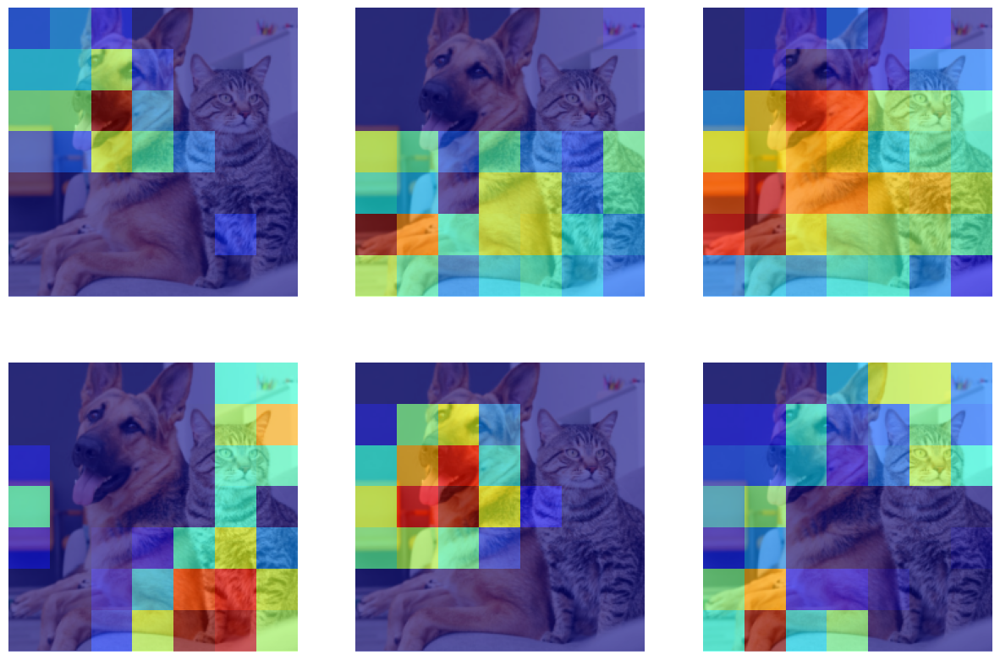

In [ ]:
plt.figure(figsize=(15, 10))

for i in range(6):
    plt.subplot(2, 3, i + 1)
    plt.imshow(img_arr)
    plt.imshow(
        history["feature_map"][0][i],
        alpha=0.6,
        extent=(0, 224, 224, 0),
        interpolation="nearest",
        cmap="jet",
    )
    plt.axis("off")

plt.show()

Вспомним предсказание модели.

In [ ]:
import torch.nn.functional as F

number_of_top_classes = 6

prediction = F.softmax(output, dim=1)
top_props, top_inds = prediction.topk(number_of_top_classes)


for i in range(number_of_top_classes):
    category_name = idx2label[top_inds[0][i].item()]
    score = top_props[0][i].item()
    print(f"{category_name} {top_inds[0][i].item()}: {100 * score:.1f}%")

German_shepherd 235: 36.2%
tabby 281: 6.4%
tiger_cat 282: 4.1%
space_heater 811: 3.2%
Egyptian_cat 285: 2.5%
hamper 588: 1.4%


Мы смогли понять, к какой части изображения относятся те или иные признаки. Теперь попробуем понять, как они соотносятся с классом. Мы помним, что градиент указывает направление возрастания функции. Если мы выберем логит, соответствующий метке класса, и посчитаем для него градиент, то мы сможем увидеть, какие признаки имеют положительные значения (при их увеличении модель будет больше уверена в оценке).

Напишем хук для сохранения значения градиента. Мы смотрим значения градиента на выходе слоя перед `AdaptiveAvgPool2d`, поэтому сохраним только средние значения (значение градиента для карт признаков одного канала будет одинаковым).

In [ ]:
def get_backward_hook(history_dict, key):
    def backward_hook(self, grad_input_, grad_output):  # for tensors
        history_dict[key] = (
            grad_output[0].detach().clone().mean(dim=[2, 3], keepdim=True)
        )

    return backward_hook


def register_model_hooks(model):
    hooks_data_history = defaultdict(list)

    forward_hook = get_forward_hook(hooks_data_history, "feature_map")
    model._modules["layer4"].register_forward_hook(forward_hook)

    backward_hook = get_backward_hook(hooks_data_history, "weight")
    model._modules["layer4"].register_full_backward_hook(backward_hook)
    return hooks_data_history

Итоговая формула **Grad-CAM** (Class activation maps):

$$\large \text{CAM} = \text{ReLU}(\sum_{i=1}^{Nch}w_iA_i),$$

где $A_i$ — каналы карты признаков, $w_i$ — веса, полученные пропусканием градиента по логиту, соответствующему метке класса. $\text{ReLU}$ используется потому, что нам интересны только положительно влияющие на метку класса признаки.

Функция, рассчитывающая CAM:

In [ ]:
def get_cam_map(model, img, class_num):
    history = register_model_hooks(model)

    output = model.eval()(img)
    activation = history["feature_map"]

    output[0, class_num].backward()
    weight = history["weight"]

    cam_map = F.relu((weight[0] * activation[0]).sum(0)).detach().cpu()
    return cam_map

Визуализация важности признаков для top-6 классов:

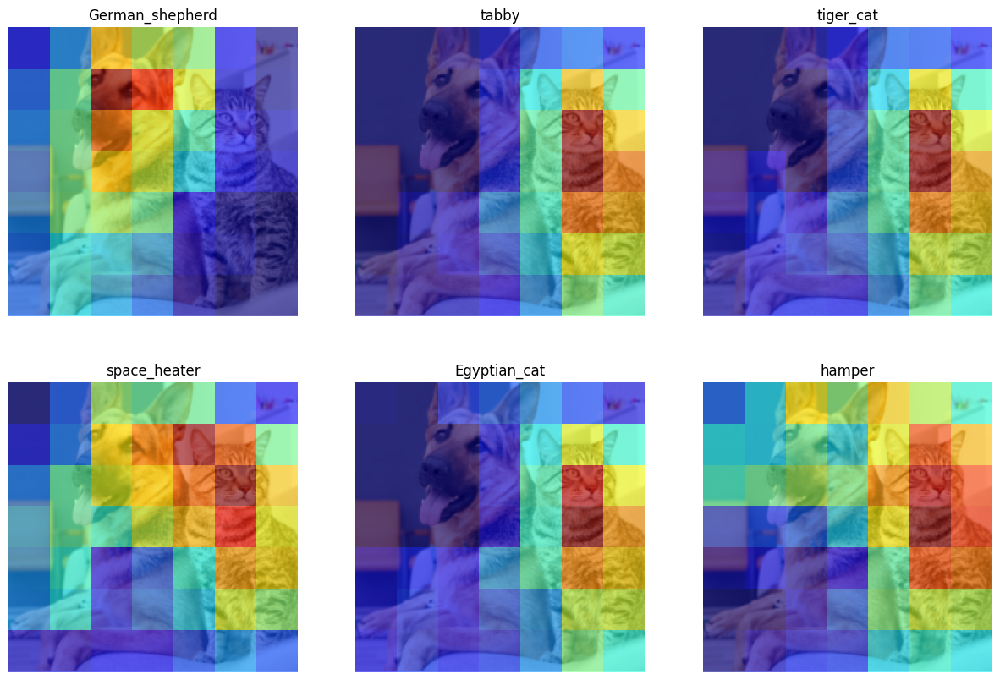

In [ ]:
plt.figure(figsize=(15, 10))

for i in range(6):
    cam_map = get_cam_map(model, img_t, top_inds[0][i])

    plt.subplot(2, 3, i + 1)
    plt.imshow(img_arr)
    plt.imshow(
        cam_map,
        alpha=0.6,
        extent=(0, 224, 224, 0),
        interpolation="nearest",
        cmap="jet",
    )
    plt.title(idx2label[top_inds[0][i].item()])
    plt.axis("off")

plt.show()

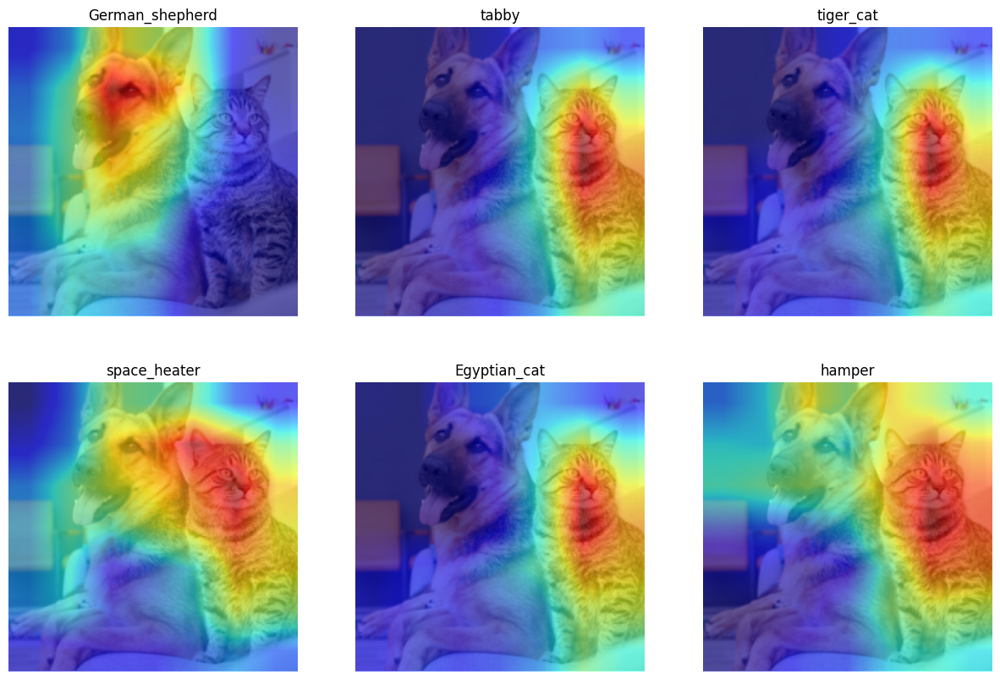

In [ ]:
plt.figure(figsize=(15, 10))

for i in range(6):
    cam_map = get_cam_map(model, img_t, top_inds[0][i])

    plt.subplot(2, 3, i + 1)
    plt.imshow(img_arr)
    plt.imshow(
        cam_map,
        alpha=0.6,
        extent=(0, 224, 224, 0),
        interpolation="bilinear",
        cmap="jet",
    )
    plt.title(idx2label[top_inds[0][i].item()])
    plt.axis("off")

plt.show()

### Пример изображения (ResNet-18)

Можно сделать все то же самое с помощью библиотеки  Grad-CAM.

In [ ]:
%%capture
!pip install -q grad-cam

In [ ]:
from pytorch_grad_cam import GradCAM

target_layers = [model._modules["layer4"]]

cam = GradCAM(model=model, target_layers=target_layers)

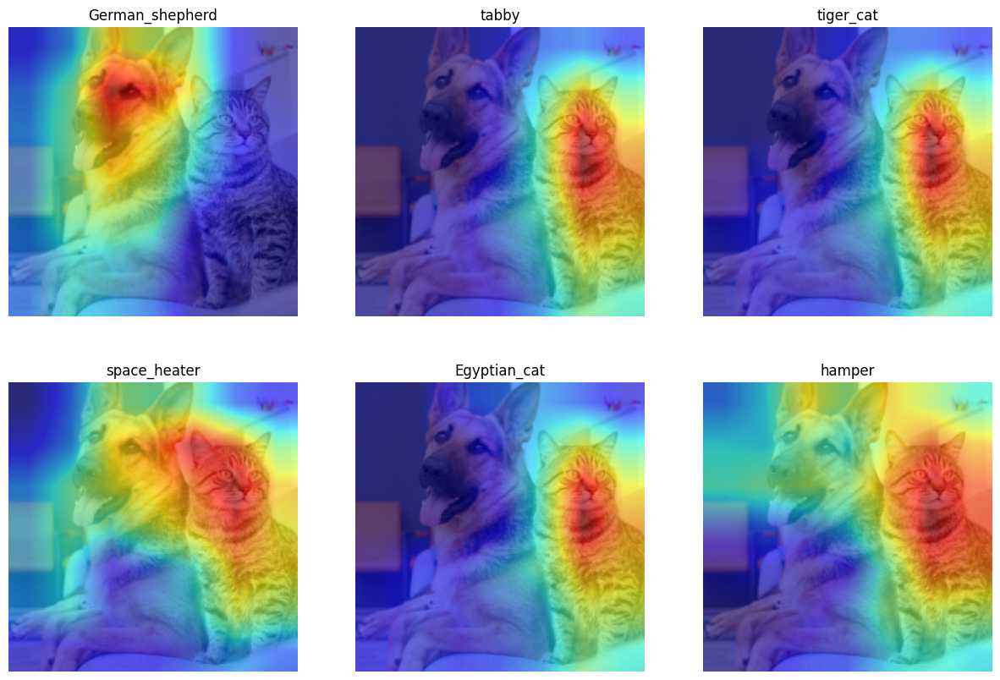

In [ ]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

plt.figure(figsize=(15, 10))

for i in range(6):
    target = [ClassifierOutputTarget(top_inds[0][i])]
    cam_map = cam(input_tensor=img_t, targets=target)

    plt.subplot(2, 3, i + 1)
    plt.imshow(img_arr)
    plt.imshow(cam_map[0], alpha=0.6, interpolation="bilinear", cmap="jet")
    plt.title(idx2label[top_inds[0][i].item()])
    plt.axis("off")

plt.show()

В библиотеке также реализованы другие методы визуализации, например, Grad-CAM++, использующий производные второго порядка.

In [ ]:
from pytorch_grad_cam import GradCAMPlusPlus

target_layers = [model._modules["layer4"]]
cam_plus = GradCAMPlusPlus(model=model, target_layers=target_layers)

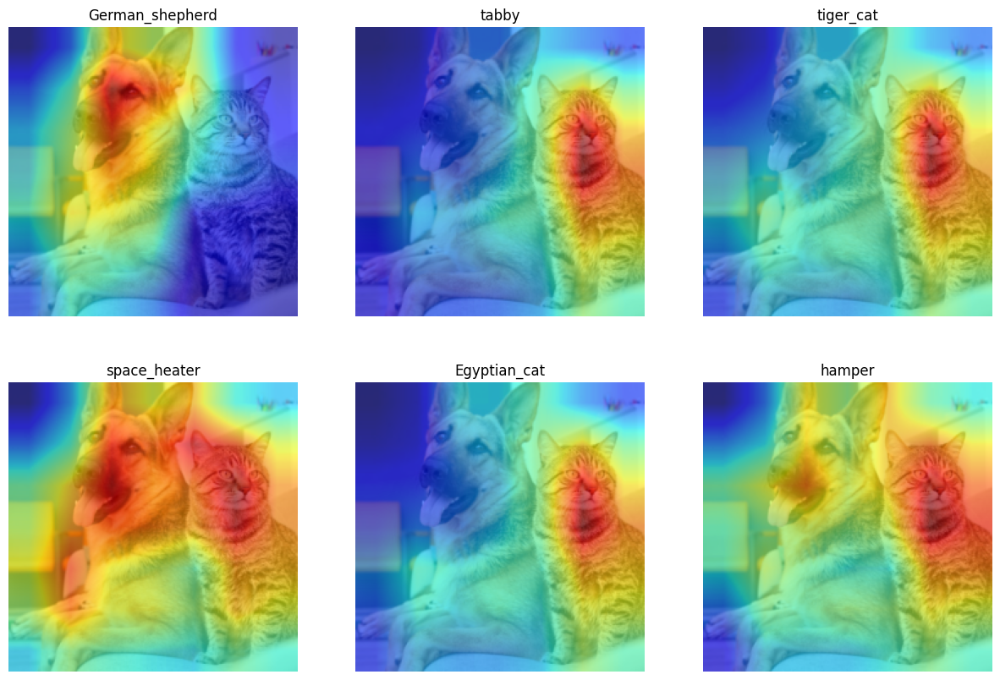

In [ ]:
from pytorch_grad_cam.utils.model_targets import ClassifierOutputTarget

plt.figure(figsize=(15, 10))

for i in range(6):
    target = [ClassifierOutputTarget(top_inds[0][i])]
    cam_map = cam_plus(input_tensor=img_t, targets=target)

    plt.subplot(2, 3, i + 1)
    plt.imshow(img_arr)
    plt.imshow(cam_map[0], alpha=0.6, interpolation="bilinear", cmap="jet")
    plt.title(idx2label[top_inds[0][i].item()])
    plt.axis("off")

plt.show()

## Критика градиентных методов

Градиентные методы имеют существенное преимущество перед SHAP и LIME: они вычисляются быстрее, чем методы, не зависящие от моделей. Но у них есть ряд недостатков. Недостаток в том, что в статьях, где предлагались такие методы, **качество работы оценивалось визуально**, “на глаз”.

Хорошим примером проблемы визуальной оценки является метод **Guided Backpropagation**, описанный в [статье](https://arxiv.org/pdf/1412.6806.pdf).

[Объяснение метода и код](https://leslietj.github.io/2020/07/22/Deep-Learning-Guided-BackPropagation/)

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/Guided_Backpropagation.png" alt="alttext" width="600"/></center>

<center><em>Картинка получена применением модели ResNet-18 и Guided Backpropagation</em></center>

Интуитивно нам кажется, что **Guided Backpropagation** дает хорошее объяснение работы модели, потому что выделяет границы, по которым легко узнать объект.

В статье [Sanity Checks for Saliency Maps](https://arxiv.org/pdf/1810.03292.pdf) было показано, что Guided Backpropagation и ряд других методов оказываются инвариантны к рандомизации весов верхних слоев модели, что ставит под сомнение их применимость для объяснения работы моделей.

В этом исследовании себя хорошо зарекомендовал только Grad-CAM: при последовательной рандомизации слоев модели карты важности, полученные этим методом, становятся бессмысленными.

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/gradient_methods_critics.png" alt="alttext" width="1000"/></center>

<center><em>Показан результат Guided Backpropagation  при рандомизации слоев в модели Inception-v3, начиная с последнего

Source: <a href="https://arxiv.org/pdf/1810.03292.pdf">Sanity Checks for Saliency Maps.</a></em></center>



В статье [Interpretation of Neural Networks is Fragile](https://arxiv.org/abs/1710.10547) было показано, что небольшое случайное возмущение, добавленное к картинке, не влияющее на результат предсказания, может существенно поменять карты важности, что является спорной критикой, потому что на результат работы нейросети такое возмущение тоже может повлиять:

<center><img src="https://edunet.kea.su/repo/EduNet-web_dependencies/dev-2.3/L14/criticism_grad_1.png" alt="alttext" width="500"/></center>

<center><em>Source: <a href="https://arxiv.org/abs/1710.10547">Interpretation of Neural Networks is Fragile</a></em></center>